In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.model_selection import train_test_split

In [2]:
#Create a path to where your data is stored.
path = r'C:\Users\Hiroshi\Documents\06-2024 ClimateWins'

In [3]:
#Read in the European weather data.
climate_nodate_cleaned = pd.read_csv(os.path.join(path, '01 Data','climate_nodate_cleaned.csv'))
climate_nodate_cleaned

,Unnamed: 0,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,0,7,0.85,1.0180,0.32,0.09,0.7,6.5,0.8,10.9,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,1,6,0.84,1.0180,0.36,1.05,1.1,6.1,3.3,10.1,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,2,8,0.90,1.0180,0.18,0.30,0.0,8.5,5.1,9.9,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,3,3,0.92,1.0180,0.58,0.00,4.1,6.3,3.8,10.6,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,4,6,0.95,1.0180,0.65,0.14,5.4,3.0,-0.7,6.0,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,22945,1,0.79,1.0248,1.34,0.22,7.7,15.9,11.4,21.4,...,14.2,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22946,22946,6,0.77,1.0244,1.34,0.22,5.4,16.7,14.3,21.9,...,14.3,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22947,22947,4,0.76,1.0227,1.34,0.22,6.1,16.7,13.1,22.4,...,14.4,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22948,22948,5,0.80,1.0212,1.34,0.22,5.8,15.4,11.6,21.1,...,12.4,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5


In [4]:
#Read in the European weather data.
climate = pd.read_csv(os.path.join(path, '01 Data','Weather_prediction.csv'))
climate

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,2.1,0.85,1.0180,0.32,0.09,0,0.7,...,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9
1,19600102,1,6,2.1,0.84,1.0180,0.36,1.05,0,1.1,...,7,0.91,1.0007,0.25,0.84,0,0.7,8.9,5.6,12.1
2,19600103,1,8,2.1,0.90,1.0180,0.18,0.30,0,0.0,...,7,0.91,1.0096,0.17,0.08,0,0.1,10.5,8.1,12.9
3,19600104,1,3,2.1,0.92,1.0180,0.58,0.00,0,4.1,...,7,0.86,1.0184,0.13,0.98,0,0.0,7.4,7.3,10.6
4,19600105,1,6,2.1,0.95,1.0180,0.65,0.14,0,5.4,...,3,0.80,1.0328,0.46,0.00,0,5.7,5.7,3.0,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,1,2.1,0.79,1.0248,1.34,0.22,0,7.7,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5
22946,20221028,10,6,2.1,0.77,1.0244,1.34,0.22,0,5.4,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5
22947,20221029,10,4,2.1,0.76,1.0227,1.34,0.22,0,6.1,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5
22948,20221030,10,5,2.1,0.80,1.0212,1.34,0.22,0,5.8,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5


In [61]:
#Read in the pleasant weather data.
weather = pd.read_csv(os.path.join(path, '01 Data','Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'))
weather

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22946,20221028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22947,20221029,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22948,20221030,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [6]:
climate_nodate_cleaned = climate_nodate_cleaned.drop(['Unnamed: 0'], axis=1)

In [7]:
climate_nodate_cleaned.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,1,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,6,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,6,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,8,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,8,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [8]:
#Combine date and cleaned data
climate_date = pd.concat([climate['DATE'],climate_nodate_cleaned], axis=1)
climate_date

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,7,0.85,1.0180,0.32,0.09,0.7,6.5,0.8,10.9,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,19600102,6,0.84,1.0180,0.36,1.05,1.1,6.1,3.3,10.1,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,19600103,8,0.90,1.0180,0.18,0.30,0.0,8.5,5.1,9.9,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,19600104,3,0.92,1.0180,0.58,0.00,4.1,6.3,3.8,10.6,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,19600105,6,0.95,1.0180,0.65,0.14,5.4,3.0,-0.7,6.0,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,1,0.79,1.0248,1.34,0.22,7.7,15.9,11.4,21.4,...,14.2,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22946,20221028,6,0.77,1.0244,1.34,0.22,5.4,16.7,14.3,21.9,...,14.3,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22947,20221029,4,0.76,1.0227,1.34,0.22,6.1,16.7,13.1,22.4,...,14.4,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22948,20221030,5,0.80,1.0212,1.34,0.22,5.8,15.4,11.6,21.1,...,12.4,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5


In [9]:
#Reduce your dataset to a single year
dfyear = climate_date.loc[climate_date['DATE'].astype(str).str[:4].isin(['2020','2019','2018','2017','2016','2015','2014','2013','2012','2011'])] #<-----INSERT YEAR HERE
dfyear

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
18628,20110101,8,0.97,1.0232,0.13,0.00,0.0,-0.2,-0.8,0.3,...,-0.5,5,0.82,1.0142,0.13,0.41,3.4,10.7,7.9,6.6
18629,20110102,8,0.94,1.0234,0.13,0.00,0.0,-0.2,-3.9,1.4,...,-2.4,5,0.82,1.0142,0.15,0.41,3.4,10.7,7.9,5.4
18630,20110103,4,0.93,1.0254,0.64,0.00,6.1,-3.3,-5.2,-0.9,...,-2.6,5,0.82,1.0142,0.17,0.41,3.4,10.7,7.9,4.5
18631,20110104,6,0.89,1.0208,0.38,0.00,1.0,-3.6,-5.8,-1.9,...,-5.6,5,0.82,1.0142,0.22,0.41,3.4,10.7,7.9,7.9
18632,20110105,5,0.79,1.0142,0.64,0.06,6.5,-0.8,-5.4,2.5,...,-0.2,5,0.82,1.0142,0.23,0.41,3.4,10.7,7.9,7.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,20201227,8,0.70,1.0007,0.26,0.41,0.0,1.7,-3.6,9.9,...,5.3,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22277,20201228,7,0.74,0.9828,0.26,0.11,0.4,4.6,1.9,8.1,...,4.8,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22278,20201229,6,0.74,0.9945,0.25,0.22,0.2,4.4,1.6,6.9,...,5.6,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22279,20201230,6,0.85,1.0069,0.32,0.04,0.3,2.6,0.5,4.9,...,4.4,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5


In [10]:
climate_nodate = dfyear.drop(['DATE'], axis=1)

In [11]:
#Reduce your dataset to a single year
weather_year = weather.loc[weather['DATE'].astype(str).str[:4].isin(['2020','2019','2018','2017','2016','2015','2014','2013','2012','2011'])] #<-----INSERT YEAR HERE
weather_year

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
18628,20110101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18629,20110102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18630,20110103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18631,20110104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18632,20110105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,20201227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22277,20201228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22278,20201229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22279,20201230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [12]:
# Drop date column from prediction data
weather_year = weather_year.drop(['DATE'], axis=1)

In [13]:
weather_year 

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
18628,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18629,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18630,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18631,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18632,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22277,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22278,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22279,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [14]:
tf.random.set_seed(42)

In [15]:
X = climate_nodate
y = weather_year
X

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
18628,8,0.97,1.0232,0.13,0.00,0.0,-0.2,-0.8,0.3,4,...,-0.5,5,0.82,1.0142,0.13,0.41,3.4,10.7,7.9,6.6
18629,8,0.94,1.0234,0.13,0.00,0.0,-0.2,-3.9,1.4,8,...,-2.4,5,0.82,1.0142,0.15,0.41,3.4,10.7,7.9,5.4
18630,4,0.93,1.0254,0.64,0.00,6.1,-3.3,-5.2,-0.9,7,...,-2.6,5,0.82,1.0142,0.17,0.41,3.4,10.7,7.9,4.5
18631,6,0.89,1.0208,0.38,0.00,1.0,-3.6,-5.8,-1.9,4,...,-5.6,5,0.82,1.0142,0.22,0.41,3.4,10.7,7.9,7.9
18632,5,0.79,1.0142,0.64,0.06,6.5,-0.8,-5.4,2.5,1,...,-0.2,5,0.82,1.0142,0.23,0.41,3.4,10.7,7.9,7.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,8,0.70,1.0007,0.26,0.41,0.0,1.7,-3.6,9.9,7,...,5.3,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22277,7,0.74,0.9828,0.26,0.11,0.4,4.6,1.9,8.1,4,...,4.8,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22278,6,0.74,0.9945,0.25,0.22,0.2,4.4,1.6,6.9,2,...,5.6,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5
22279,6,0.85,1.0069,0.32,0.04,0.3,2.6,0.5,4.9,7,...,4.4,5,0.82,1.0142,1.13,0.41,3.4,10.7,7.9,13.5


In [16]:
print(X.shape)
print(y.shape)

(3653, 135)
(3653, 15)


In [17]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [18]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2922, 135) (2922, 15)
(731, 135) (731, 15)


In [19]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100) #, max_depth=20)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [20]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.6114911080711354


In [21]:
pred = ['Bad weather','Good weather']

[Text(0.34682100867275706, 0.9722222222222222, 'x[80] <= 17.65\ngini = 0.322\nsamples = 1839\nvalue = [[2090, 832]\n[1804, 1118]\n[1816, 1106]\n[2268, 654]\n[2202, 720]\n[2241, 681]\n[2716, 206]\n[1991, 931]\n[2179, 743]\n[1520, 1402]\n[2209, 713]\n[2445, 477]\n[2922, 0]\n[2328, 594]\n[2922, 0]]'),
 Text(0.11204350415806726, 0.9166666666666666, 'x[26] <= 17.95\ngini = 0.107\nsamples = 1080\nvalue = [[1595, 119]\n[1412, 302]\n[1453, 261]\n[1701, 13]\n[1682, 32]\n[1617, 97]\n[1705, 9]\n[1530, 184]\n[1714, 0]\n[1270, 444]\n[1622, 92]\n[1680, 34]\n[1714, 0]\n[1676, 38]\n[1714, 0]]'),
 Text(0.04472198616000971, 0.8611111111111112, 'x[89] <= 17.9\ngini = 0.037\nsamples = 836\nvalue = [[1296, 35]\n[1271, 60]\n[1331, 0]\n[1329, 2]\n[1320, 11]\n[1299, 32]\n[1331, 0]\n[1295, 36]\n[1331, 0]\n[1117, 214]\n[1320, 11]\n[1325, 6]\n[1331, 0]\n[1329, 2]\n[1331, 0]]'),
 Text(0.024007527012261744, 0.8055555555555556, 'x[35] <= 16.4\ngini = 0.007\nsamples = 673\nvalue = [[1082, 5]\n[1050, 37]\n[1087, 0]\n

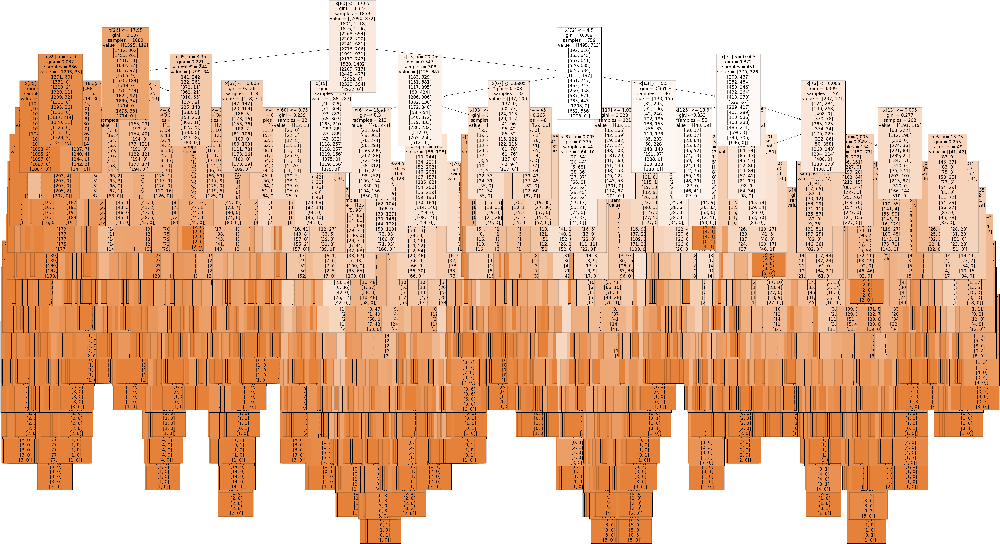

In [22]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [23]:
fig.savefig(f"{path}/decision_tree.png")

[Text(0.3393002876507788, 0.9782608695652174, 'x[71] <= 18.25\ngini = 0.317\nsamples = 1832\nvalue = [[2100, 822]\n[1806, 1116]\n[1817, 1105]\n[2312, 610]\n[2228, 694]\n[2241, 681]\n[2717, 205]\n[2024, 898]\n[2214, 708]\n[1506, 1416]\n[2211, 711]\n[2496, 426]\n[2922, 0]\n[2356, 566]\n[2922, 0]]'),
 Text(0.09498925884178475, 0.9347826086956522, 'x[107] <= 9.45\ngini = 0.071\nsamples = 943\nvalue = [[1459, 56]\n[1374, 141]\n[1417, 98]\n[1480, 35]\n[1469, 46]\n[1442, 73]\n[1508, 7]\n[1496, 19]\n[1465, 50]\n[1210, 305]\n[1474, 41]\n[1501, 14]\n[1515, 0]\n[1499, 16]\n[1515, 0]]'),
 Text(0.04995827965803958, 0.8913043478260869, 'x[26] <= 18.2\ngini = 0.035\nsamples = 760\nvalue = [[1212, 12]\n[1133, 91]\n[1179, 45]\n[1215, 9]\n[1212, 12]\n[1209, 15]\n[1222, 2]\n[1221, 3]\n[1207, 17]\n[1101, 123]\n[1206, 18]\n[1224, 0]\n[1224, 0]\n[1224, 0]\n[1224, 0]]'),
 Text(0.03076326267712847, 0.8478260869565217, 'x[24] <= 9.25\ngini = 0.024\nsamples = 722\nvalue = [[1154, 10]\n[1109, 55]\n[1164, 0]\n[11

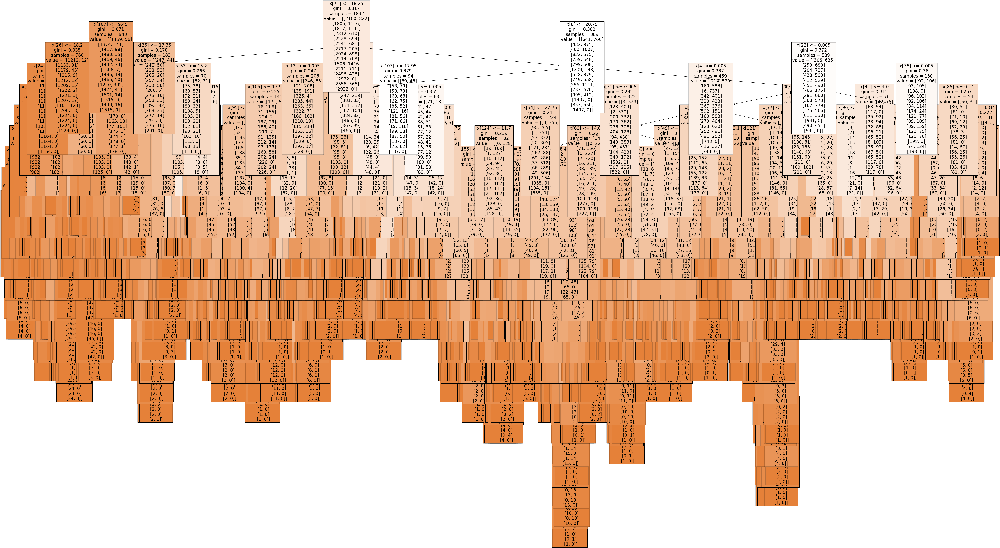

In [24]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[99], fontsize = 20, class_names=pred, filled=True)

In [25]:
fig.savefig(f"{path}/decision_tree2.png")

In [26]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([2.87681666e-03, 3.75290053e-03, 3.45805683e-03, 5.19544508e-03,
       2.01057930e-02, 1.02962726e-02, 1.77294914e-02, 5.87665014e-03,
       2.99986879e-02, 3.73460903e-03, 3.38296618e-03, 4.51005644e-03,
       2.74637166e-03, 1.56251220e-02, 3.09655855e-03, 8.32587530e-03,
       3.17123365e-03, 1.52863060e-02, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 1.11069764e-03, 1.60954092e-02, 1.09099813e-03,
       7.71844378e-03, 8.91669772e-03, 2.51893192e-02, 2.70575284e-03,
       2.90292560e-03, 5.34243365e-03, 5.76039908e-03, 2.03340604e-02,
       5.03518685e-03, 8.48986853e-03, 2.82262669e-03, 3.23263635e-02,
       2.64476479e-03, 3.61997718e-03, 5.94678696e-03, 5.48780166e-03,
       1.79180398e-02, 5.88750560e-03, 1.68656744e-02, 3.03590140e-03,
       2.85494058e-02, 2.60348449e-03, 4.52263995e-03, 3.61854286e-03,
       4.21927365e-03, 9.75525931e-03, 4.25650187e-03, 1.25058045e-02,
       2.92817294e-03, 3.94413191e-03, 1.33495031e-02, 2.32388077e-03,
      

In [27]:
np.set_printoptions(threshold=1000)

In [28]:
newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[2.87681666e-03, 3.75290053e-03, 3.45805683e-03, 5.19544508e-03,
         2.01057930e-02, 1.02962726e-02, 1.77294914e-02, 5.87665014e-03,
         2.99986879e-02],
        [3.73460903e-03, 3.38296618e-03, 4.51005644e-03, 2.74637166e-03,
         1.56251220e-02, 3.09655855e-03, 8.32587530e-03, 3.17123365e-03,
         1.52863060e-02],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.11069764e-03,
         1.60954092e-02, 1.09099813e-03, 7.71844378e-03, 8.91669772e-03,
         2.51893192e-02],
        [2.70575284e-03, 2.90292560e-03, 5.34243365e-03, 5.76039908e-03,
         2.03340604e-02, 5.03518685e-03, 8.48986853e-03, 2.82262669e-03,
         3.23263635e-02],
        [2.64476479e-03, 3.61997718e-03, 5.94678696e-03, 5.48780166e-03,
         1.79180398e-02, 5.88750560e-03, 1.68656744e-02, 3.03590140e-03,
         2.85494058e-02],
        [2.60348449e-03, 4.52263995e-03, 3.61854286e-03, 4.21927365e-03,
         9.75525931e-03, 4.25650187e-03, 1.25058045e-02, 2.92817294

In [33]:
sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.09929011, 0.0598791 , 0.06012157, 0.08571962, 0.08995586,
       0.04835381, 0.03452389, 0.0972441 , 0.08687197, 0.06513112,
       0.10991875, 0.06913304, 0.03729253, 0.05359604, 0.00296849])

In [30]:
climate_nodate_cleaned.columns.tolist()

['BASEL_cloud_cover',
 'BASEL_humidity',
 'BASEL_pressure',
 'BASEL_global_radiation',
 'BASEL_precipitation',
 'BASEL_sunshine',
 'BASEL_temp_mean',
 'BASEL_temp_min',
 'BASEL_temp_max',
 'BELGRADE_cloud_cover',
 'BELGRADE_humidity',
 'BELGRADE_pressure',
 'BELGRADE_global_radiation',
 'BELGRADE_precipitation',
 'BELGRADE_sunshine',
 'BELGRADE_temp_mean',
 'BELGRADE_temp_min',
 'BELGRADE_temp_max',
 'BUDAPEST_cloud_cover',
 'BUDAPEST_humidity',
 'BUDAPEST_pressure',
 'BUDAPEST_global_radiation',
 'BUDAPEST_precipitation',
 'BUDAPEST_sunshine',
 'BUDAPEST_temp_mean',
 'BUDAPEST_temp_min',
 'BUDAPEST_temp_max',
 'DEBILT_cloud_cover',
 'DEBILT_humidity',
 'DEBILT_pressure',
 'DEBILT_global_radiation',
 'DEBILT_precipitation',
 'DEBILT_sunshine',
 'DEBILT_temp_mean',
 'DEBILT_temp_min',
 'DEBILT_temp_max',
 'DUSSELDORF_cloud_cover',
 'DUSSELDORF_humidity',
 'DUSSELDORF_pressure',
 'DUSSELDORF_global_radiation',
 'DUSSELDORF_precipitation',
 'DUSSELDORF_sunshine',
 'DUSSELDORF_temp_mean',


In [31]:
variables = [
    'Basel',
    'Belgrade',
    'Budapest',
    'Debilt',
    'Dusseldorf',
    'Heathrow',
    'Kassel',
    'Ljubljana',
    'Maastricht',
    'Madrid',
    'Munchenb',
    'Oslo',
    'Sonnblick',
    'Stockholm',
    'Valentia'
]

In [35]:
important = pd.Series(sumarray, index = variables) #.sort_values(ascending = False)
important

Basel         0.099290
Belgrade      0.059879
Budapest      0.060122
Debilt        0.085720
Dusseldorf    0.089956
Heathrow      0.048354
Kassel        0.034524
Ljubljana     0.097244
Maastricht    0.086872
Madrid        0.065131
Munchenb      0.109919
Oslo          0.069133
Sonnblick     0.037293
Stockholm     0.053596
Valentia      0.002968
dtype: float64

['Basel', 'Belgrade', 'Budapest', 'Debilt', 'Dusseldorf', 'Heathrow', 'Kassel', 'Ljubljana', 'Maastricht', 'Madrid', 'Munchenb', 'Oslo', 'Sonnblick', 'Stockholm', 'Valentia']


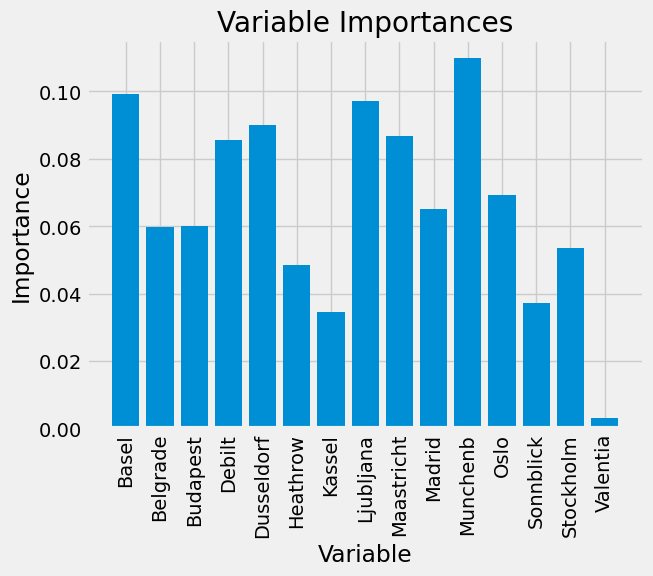

In [37]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(variables)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, variables, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### Munchenb

In [48]:
climate_munchenb = climate_nodate_cleaned[['MUNCHENB_cloud_cover','MUNCHENB_humidity','MUNCHENB_pressure','MUNCHENB_global_radiation','MUNCHENB_precipitation','MUNCHENB_sunshine','MUNCHENB_temp_mean','MUNCHENB_temp_min','MUNCHENB_temp_max']]
climate_munchenb

,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_pressure,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max
0,5,0.67,1.0304,0.20,0.10,0.0,6.9,1.1,10.4
1,6,0.72,1.0292,0.61,0.30,5.1,6.2,4.2,10.2
2,6,0.91,1.0320,0.20,0.30,0.0,5.8,4.0,8.0
3,6,0.90,1.0443,0.20,0.01,0.0,3.9,3.2,5.4
4,5,0.85,1.0430,0.65,0.96,5.6,1.8,-3.0,6.0
...,...,...,...,...,...,...,...,...,...
22945,2,0.76,1.0263,1.37,0.26,9.7,14.3,8.3,22.2
22946,6,0.70,1.0263,1.37,0.26,7.7,16.1,8.9,26.1
22947,7,0.64,1.0263,1.37,0.26,6.8,17.4,11.2,26.2
22948,6,0.75,1.0263,1.37,0.26,8.3,14.5,9.2,23.5


In [51]:
weather

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22946,20221028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22947,20221029,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22948,20221030,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [63]:
weather_munchenb = weather[['MUNCHENB_pleasant_weather']]
weather_munchenb

,MUNCHENB_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [65]:
X = climate_munchenb
y = weather_munchenb
X

,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_pressure,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max
0,5,0.67,1.0304,0.20,0.10,0.0,6.9,1.1,10.4
1,6,0.72,1.0292,0.61,0.30,5.1,6.2,4.2,10.2
2,6,0.91,1.0320,0.20,0.30,0.0,5.8,4.0,8.0
3,6,0.90,1.0443,0.20,0.01,0.0,3.9,3.2,5.4
4,5,0.85,1.0430,0.65,0.96,5.6,1.8,-3.0,6.0
...,...,...,...,...,...,...,...,...,...
22945,2,0.76,1.0263,1.37,0.26,9.7,14.3,8.3,22.2
22946,6,0.70,1.0263,1.37,0.26,7.7,16.1,8.9,26.1
22947,7,0.64,1.0263,1.37,0.26,6.8,17.4,11.2,26.2
22948,6,0.75,1.0263,1.37,0.26,8.3,14.5,9.2,23.5


In [67]:
print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [69]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [71]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 9) (18360, 1)
(4590, 9) (4590, 1)


In [73]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100) #, max_depth=20)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

C:\Users\Hiroshi\anaconda3\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [75]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


In [77]:
pred = ['Bad weather','Good weather']

[Text(0.4, 0.875, 'x[8] <= 17.95\ngini = 0.327\nsamples = 11666\nvalue = [14581, 3779]\nclass = Bad weather'),
 Text(0.2, 0.625, 'gini = 0.0\nsamples = 7562\nvalue = [11843, 0]\nclass = Bad weather'),
 Text(0.6, 0.625, 'x[4] <= 0.005\ngini = 0.487\nsamples = 4104\nvalue = [2738, 3779]\nclass = Good weather'),
 Text(0.4, 0.375, 'x[5] <= 0.95\ngini = 0.021\nsamples = 2387\nvalue = [41, 3779]\nclass = Good weather'),
 Text(0.2, 0.125, 'gini = 0.0\nsamples = 30\nvalue = [41, 0]\nclass = Bad weather'),
 Text(0.6, 0.125, 'gini = 0.0\nsamples = 2357\nvalue = [0, 3779]\nclass = Good weather'),
 Text(0.8, 0.375, 'gini = 0.0\nsamples = 1717\nvalue = [2697, 0]\nclass = Bad weather')]

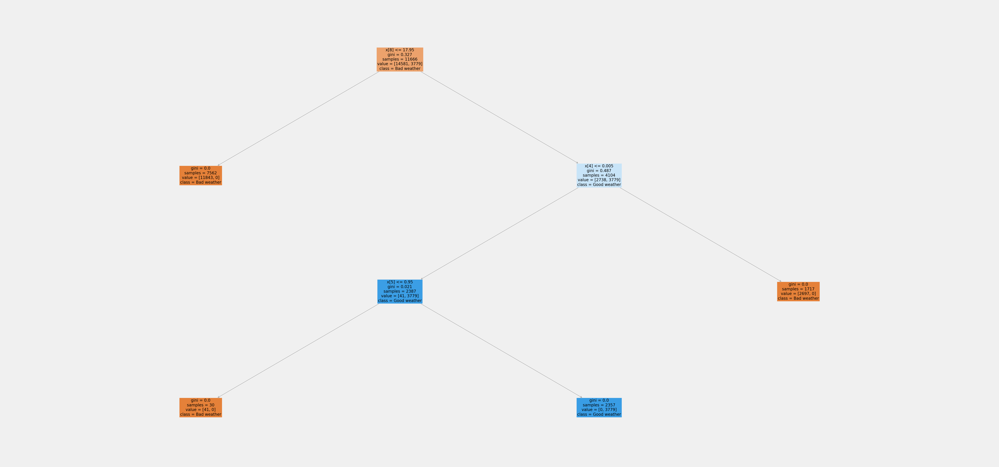

In [79]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [81]:
fig.savefig(f"{path}/decision_tree_munchenb.png")

In [82]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.04034996, 0.01283061, 0.01073975, 0.03472502, 0.37158193,
       0.10655055, 0.11100056, 0.01609193, 0.2961297 ])

In [85]:
np.set_printoptions(threshold=1000)

In [89]:
variables = [
    'Cloud cover',
    'Humidity',
    'Pressure',
    'Global ratiation',
    'Precipitation',
    'Sunshine',
    'Temp mean',
    'Temp min',
    'Temp max'
]

In [91]:
important = pd.Series(newarray, index = variables) #.sort_values(ascending = False)
important

Cloud cover         0.040350
Humidity            0.012831
Pressure            0.010740
Global ratiation    0.034725
Precipitation       0.371582
Sunshine            0.106551
Temp mean           0.111001
Temp min            0.016092
Temp max            0.296130
dtype: float64

['Cloud cover', 'Humidity', 'Pressure', 'Global ratiation', 'Precipitation', 'Sunshine', 'Temp mean', 'Temp min', 'Temp max']


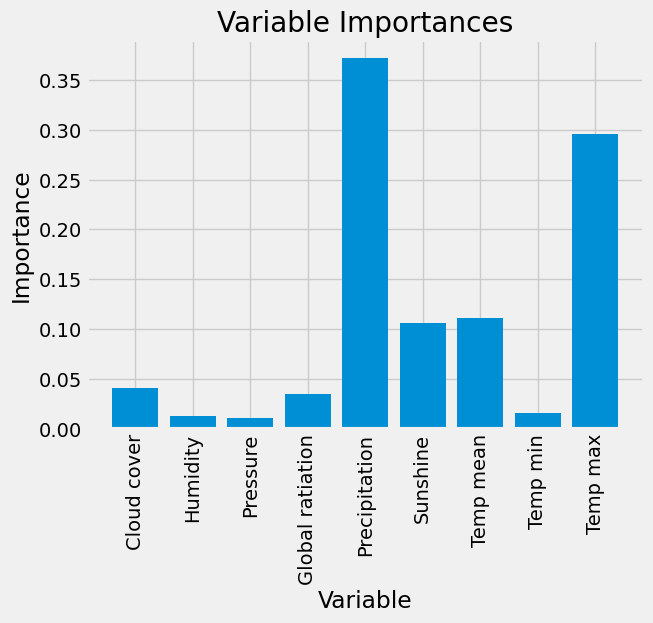

In [93]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(variables)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, variables, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

#### Basel

In [97]:
climate_basel = climate_nodate_cleaned[['BASEL_cloud_cover','BASEL_humidity','BASEL_pressure','BASEL_global_radiation','BASEL_precipitation','BASEL_sunshine','BASEL_temp_mean','BASEL_temp_min','BASEL_temp_max']]
climate_basel

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
0,7,0.85,1.0180,0.32,0.09,0.7,6.5,0.8,10.9
1,6,0.84,1.0180,0.36,1.05,1.1,6.1,3.3,10.1
2,8,0.90,1.0180,0.18,0.30,0.0,8.5,5.1,9.9
3,3,0.92,1.0180,0.58,0.00,4.1,6.3,3.8,10.6
4,6,0.95,1.0180,0.65,0.14,5.4,3.0,-0.7,6.0
...,...,...,...,...,...,...,...,...,...
22945,1,0.79,1.0248,1.34,0.22,7.7,15.9,11.4,21.4
22946,6,0.77,1.0244,1.34,0.22,5.4,16.7,14.3,21.9
22947,4,0.76,1.0227,1.34,0.22,6.1,16.7,13.1,22.4
22948,5,0.80,1.0212,1.34,0.22,5.8,15.4,11.6,21.1


In [99]:
weather_basel = weather[['BASEL_pleasant_weather']]
weather_basel

,BASEL_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [101]:
X = climate_basel
y = weather_basel
X

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
0,7,0.85,1.0180,0.32,0.09,0.7,6.5,0.8,10.9
1,6,0.84,1.0180,0.36,1.05,1.1,6.1,3.3,10.1
2,8,0.90,1.0180,0.18,0.30,0.0,8.5,5.1,9.9
3,3,0.92,1.0180,0.58,0.00,4.1,6.3,3.8,10.6
4,6,0.95,1.0180,0.65,0.14,5.4,3.0,-0.7,6.0
...,...,...,...,...,...,...,...,...,...
22945,1,0.79,1.0248,1.34,0.22,7.7,15.9,11.4,21.4
22946,6,0.77,1.0244,1.34,0.22,5.4,16.7,14.3,21.9
22947,4,0.76,1.0227,1.34,0.22,6.1,16.7,13.1,22.4
22948,5,0.80,1.0212,1.34,0.22,5.8,15.4,11.6,21.1


In [103]:
print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [105]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [107]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 9) (18360, 1)
(4590, 9) (4590, 1)


In [109]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100) #, max_depth=20)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

C:\Users\Hiroshi\anaconda3\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [111]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


[Text(0.5204899267399268, 0.9642857142857143, 'x[5] <= 7.85\ngini = 0.371\nsamples = 11618\nvalue = [13843, 4517]\nclass = Bad weather'),
 Text(0.399496336996337, 0.8928571428571429, 'x[5] <= 2.55\ngini = 0.182\nsamples = 8634\nvalue = [12299, 1388]\nclass = Bad weather'),
 Text(0.23076923076923078, 0.8214285714285714, 'x[3] <= 1.205\ngini = 0.047\nsamples = 5125\nvalue = [7925, 195]\nclass = Bad weather'),
 Text(0.08424908424908426, 0.75, 'x[6] <= 12.75\ngini = 0.012\nsamples = 4471\nvalue = [7006, 43]\nclass = Bad weather'),
 Text(0.029304029304029304, 0.6785714285714286, 'x[8] <= 17.95\ngini = 0.0\nsamples = 3755\nvalue = [5862, 1]\nclass = Bad weather'),
 Text(0.014652014652014652, 0.6071428571428571, 'gini = 0.0\nsamples = 3734\nvalue = [5825, 0]\nclass = Bad weather'),
 Text(0.04395604395604396, 0.6071428571428571, 'x[2] <= 1.023\ngini = 0.051\nsamples = 21\nvalue = [37, 1]\nclass = Bad weather'),
 Text(0.029304029304029304, 0.5357142857142857, 'gini = 0.0\nsamples = 20\nvalue = 

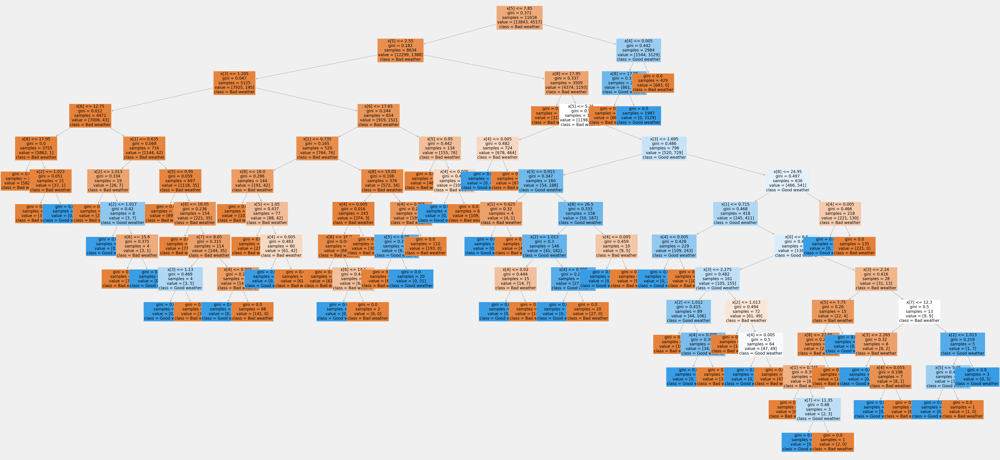

In [113]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [114]:
fig.savefig(f"{path}/decision_tree_basel.png")

In [115]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.02049216, 0.00840193, 0.00790015, 0.11340702, 0.35430396,
       0.1099991 , 0.09682223, 0.02735954, 0.2613139 ])

In [116]:
np.set_printoptions(threshold=1000)

In [117]:
important = pd.Series(newarray, index = variables) #.sort_values(ascending = False)
important

Cloud cover         0.020492
Humidity            0.008402
Pressure            0.007900
Global ratiation    0.113407
Precipitation       0.354304
Sunshine            0.109999
Temp mean           0.096822
Temp min            0.027360
Temp max            0.261314
dtype: float64

['Cloud cover', 'Humidity', 'Pressure', 'Global ratiation', 'Precipitation', 'Sunshine', 'Temp mean', 'Temp min', 'Temp max']


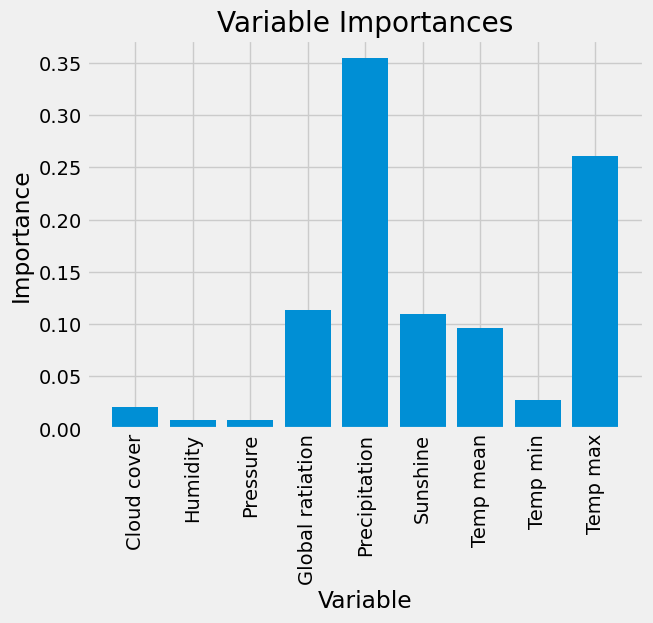

In [119]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(variables)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, variables, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances'); 

#### Ljubljana

In [129]:
climate_ljubljana = climate_nodate_cleaned[['LJUBLJANA_cloud_cover','LJUBLJANA_humidity','LJUBLJANA_pressure','LJUBLJANA_global_radiation','LJUBLJANA_precipitation','LJUBLJANA_sunshine','LJUBLJANA_temp_mean','LJUBLJANA_temp_min','LJUBLJANA_temp_max']]
climate_ljubljana

,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max
0,8,1.00,1.0173,0.20,0.00,0.0,-0.6,-1.9,0.5
1,6,0.94,1.0173,0.56,0.13,3.2,2.1,-1.3,5.5
2,8,0.96,1.0173,0.20,0.12,0.0,4.6,0.9,6.3
3,6,0.94,1.0173,0.49,0.00,2.2,3.2,1.0,7.0
4,7,0.94,1.0173,0.20,0.00,0.0,3.6,0.4,4.8
...,...,...,...,...,...,...,...,...,...
22945,4,0.80,1.0289,1.35,0.37,5.9,14.7,12.1,21.1
22946,3,0.82,1.0291,1.35,0.37,4.5,12.9,9.8,19.8
22947,3,0.81,1.0270,1.35,0.37,5.1,13.2,10.2,20.7
22948,3,0.77,1.0238,1.35,0.37,5.7,14.0,10.0,23.1


In [131]:
weather_ljubljana = weather[['LJUBLJANA_pleasant_weather']]
weather_ljubljana

,LJUBLJANA_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [133]:
X = climate_ljubljana
y = weather_ljubljana
X

,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max
0,8,1.00,1.0173,0.20,0.00,0.0,-0.6,-1.9,0.5
1,6,0.94,1.0173,0.56,0.13,3.2,2.1,-1.3,5.5
2,8,0.96,1.0173,0.20,0.12,0.0,4.6,0.9,6.3
3,6,0.94,1.0173,0.49,0.00,2.2,3.2,1.0,7.0
4,7,0.94,1.0173,0.20,0.00,0.0,3.6,0.4,4.8
...,...,...,...,...,...,...,...,...,...
22945,4,0.80,1.0289,1.35,0.37,5.9,14.7,12.1,21.1
22946,3,0.82,1.0291,1.35,0.37,4.5,12.9,9.8,19.8
22947,3,0.81,1.0270,1.35,0.37,5.1,13.2,10.2,20.7
22948,3,0.77,1.0238,1.35,0.37,5.7,14.0,10.0,23.1


In [135]:
print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [137]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [139]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 9) (18360, 1)
(4590, 9) (4590, 1)


In [141]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100) #, max_depth=20)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

C:\Users\Hiroshi\anaconda3\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [143]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


[Text(0.7182348901098901, 0.9642857142857143, 'x[3] <= 1.865\ngini = 0.398\nsamples = 11601\nvalue = [13331, 5029]\nclass = Bad weather'),
 Text(0.5010302197802198, 0.8928571428571429, 'x[5] <= 5.35\ngini = 0.169\nsamples = 7916\nvalue = [11403, 1174]\nclass = Bad weather'),
 Text(0.3482142857142857, 0.8214285714285714, 'x[7] <= 8.75\ngini = 0.075\nsamples = 6112\nvalue = [9370, 381]\nclass = Bad weather'),
 Text(0.1662087912087912, 0.75, 'x[3] <= 1.205\ngini = 0.017\nsamples = 4421\nvalue = [6980, 59]\nclass = Bad weather'),
 Text(0.07142857142857142, 0.6785714285714286, 'x[6] <= 9.95\ngini = 0.003\nsamples = 4138\nvalue = [6581, 11]\nclass = Bad weather'),
 Text(0.03296703296703297, 0.6071428571428571, 'x[0] <= 2.5\ngini = 0.0\nsamples = 3838\nvalue = [6107, 1]\nclass = Bad weather'),
 Text(0.02197802197802198, 0.5357142857142857, 'x[6] <= 8.5\ngini = 0.011\nsamples = 116\nvalue = [180, 1]\nclass = Bad weather'),
 Text(0.01098901098901099, 0.4642857142857143, 'gini = 0.0\nsamples = 1

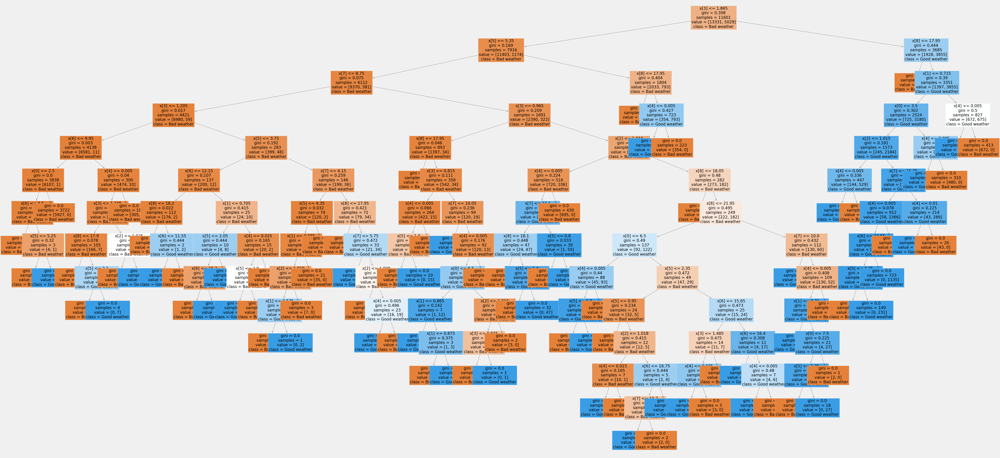

In [145]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [146]:
fig.savefig(f"{path}/decision_tree_ljubljana.png")

In [147]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.04616056, 0.01680869, 0.01200139, 0.10596744, 0.34167776,
       0.10830497, 0.09435789, 0.01906479, 0.2556565 ])

In [148]:
np.set_printoptions(threshold=1000)

In [149]:
important = pd.Series(newarray, index = variables) #.sort_values(ascending = False)
important

Cloud cover         0.046161
Humidity            0.016809
Pressure            0.012001
Global ratiation    0.105967
Precipitation       0.341678
Sunshine            0.108305
Temp mean           0.094358
Temp min            0.019065
Temp max            0.255657
dtype: float64

['Cloud cover', 'Humidity', 'Pressure', 'Global ratiation', 'Precipitation', 'Sunshine', 'Temp mean', 'Temp min', 'Temp max']


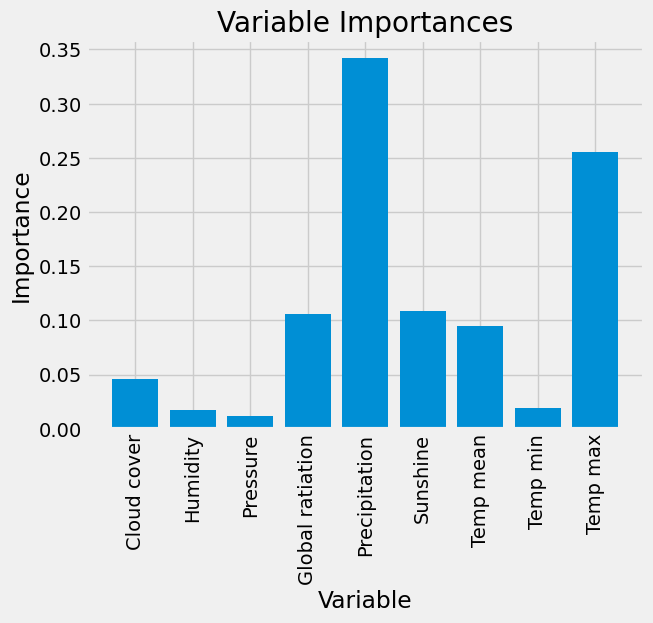

In [151]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(variables)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, variables, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances'); 